In [1]:
from typing import Tuple, List, Text, Dict, Any, Iterator, Union, Sized, Callable
import sys
import os
import time
import cProfile
import pstats
from PIL import Image
import numpy as np
import scipy
sys.path.append("/usr/local/Cellar/opencv3/3.2.0/lib/python3.5/site-packages/") # mac opencv path
import cv2
import skimage.io as io
from matplotlib import pyplot as plt
%matplotlib inline
from imgaug import augmenters as iaa
sys.path.append("./coco/PythonAPI/")
from pycocotools.coco import COCO
from pycocotools import mask as coco_mask
from chainer.iterators import MultiprocessIterator, SerialIterator
from chainer.dataset import dataset_mixin
os.environ['KERAS_BACKEND'] = 'tensorflow'
from keras.backend import set_image_data_format
set_image_data_format("channels_last") # tensorflow

def mtx_plot(fnmtx, ratio):
    h = len(fnmtx[0])
    w = len(fnmtx)
    k = 1
    fig = plt.figure(figsize=(ratio[0]*h, ratio[1]*w))
    for fnarr in fnmtx:
        for fn in fnarr:
            fig.add_subplot(w,h,k)
            fn(k)
            k += 1

Using TensorFlow backend.


In [2]:
coco_train = COCO("./data/annotations/person_keypoints_train2014.json")
#coco_val = COCO("./data/annotations/person_keypoints_val2014.json")

loading annotations into memory...
Done (t=4.92s)
creating index...
index created!


In [10]:
def check(info: dict)-> bool:
    anns = coco_train.loadAnns(coco_train.getAnnIds(imgIds=[info['id']], iscrowd=0)) # type: List[dict]
    
    centers = [(ann["bbox"][0]+ann["bbox"][2]/2, ann["bbox"][1]+ann["bbox"][3]/2) for ann in anns]

    for i, ann in enumerate(anns):
        
        # drop if people are overlapping
        x, y, w, h = ann["bbox"]
        for j, (cx, cy) in enumerate(centers):
            if i == j: continue
            if x < cx < x+w and y < cy < y+h: return False

        # drop this person if parts number is too low
        if ann["num_keypoints"] < 5: return False

        # drop if segmentation area is too small
        if ann["area"] < 64*64: return False
        
        keys = ann["keypoints"] # type: List[int]

        # drop if no head
        if not( # 2 is visible
            keys[0*3+2] == 2 # nose
            or keys[1*3+2] == 2 # l-eye
            or keys[2*3+2] == 2 # r-eye
            or keys[3*3+2] == 2 # l-ear
            or keys[4*3+2] == 2 # r-ear
        ): return False

        # drop if no body
        if (
            not(keys[5*3+2] == 2 or keys[6*3+2] == 2) # shoulder
            #or not(keys[7*3+2] == 2 or keys[8*3+2] == 2) # elbow
            or not(keys[11*3+2] == 2 or keys[12*3+2] == 2) # llium
        ): return False

    return True

In [11]:
infos = coco_train.loadImgs(coco_train.getImgIds(catIds=coco_train.getCatIds(catNms=['person']))) # type: List[dict]
print(len(infos))
infos = [info for info in infos if check(info)]
print(len(infos))

45174
10802


In [130]:
def gaussian(x, mu, sig): return (1/np.sqrt(2. * np.pi * sig)) * np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
def gaussian_kernel(kernlen=21, nsig=3):
    """Returns a 2D Gaussian kernel array."""
    interval = (2*nsig+1.)/(kernlen)
    x = np.linspace(-nsig-interval/2., nsig+interval/2., kernlen+1)
    kern1d = np.diff(scipy.stats.norm.cdf(x))
    kernel_raw = np.sqrt(np.outer(kern1d, kern1d))
    kernel = kernel_raw/kernel_raw.sum()
    return kernel

(21, 21)

In [217]:
debug = True
label = ["nose", "l-eye", "r-eye", "l-ear", "r-ear", "l-shoulder", "r-shoulder", "l-elbow", "r-elbow", "l-wrist", "r-wrist", "l-llium", "r-llium", "l-knee", "r-knee", "l-ankle", "r-ankle"]

def create_mask(info: dict) -> Tuple[np.ndarray, Tuple[float, float], np.ndarray]:
    anns = coco_train.loadAnns(coco_train.getAnnIds(imgIds=[info['id']], iscrowd=False)) # type: List[dict]
    w, h = info["width"], info["height"] # type: Tuple[int, int]
    
    mask_all = np.zeros((h, w), np.uint8) # type: np.ndarray
    mask_head = np.zeros((h, w), np.uint8) # type: np.ndarray

    for ann in anns:
        rles = coco_mask.frPyObjects(ann["segmentation"], h, w) # type: List[dict]
        for rle in rles:
            mask = coco_mask.decode(rle) # type: np.ndarray
            mask[mask > 0] = 255
            mask_all += mask

        keys = ann["keypoints"]
        parts = np.array(keys).reshape(17, 3) # type: np.ndarray
 
        # v == 2 => visible
    
        # nose, l-eye, r-eye
        face_parts = [(x,y) for x,y,v in parts[0:3] if v == 2] # type: List[Tuple[int, int]]
        # l-ear, r-ear
        ear_parts = [(x,y) for x,y,v in parts[3:5] if v == 2] # type: List[Tuple[int, int]]

        if len(face_parts) != 0:
            face_center = tuple(np.average(np.array(face_parts).T, axis=1).tolist()) # type: Tuple[float, float]
            head_parts = ear_parts + [face_center]
        else:
            head_parts = ear_parts

        head_center = tuple(np.average(np.array(head_parts).T, axis=1).tolist()) # type: Tuple[float, float]
        
        # l-shoulder, r-shoulder, l-llium, r-llium
        body_parts = [(x,y) for x,y,v in parts[5:9] if v == 2] + [(x,y) for x,y,v in parts[11:12] if v == 2] # type: List[Tuple[int, int]]
        body_center = tuple(np.average(np.array(body_parts).T, axis=1).tolist()) # type: Tuple[float, float]
        
        # annotate head position
        x, y = int(head_center[0]), int(head_center[1])
        kernel = gaussian_kernel(40)
        kernel_img = Image.fromarray((kernel*100*255).astype("uint8"))
        mask_head_img = Image.fromarray(mask_head)
        mask_head_img.paste(kernel_img, (x, y))
        mask_head = np.asarray(mask_head_img)
        mask_head.flags.writeable = True
        
        if debug: 
            x, y = int(head_center[0]), int(head_center[1])
            mask_all[y, x] = 255
            cv2.putText(mask_all, "+", (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (128,128,128))
    
            x, y = int(body_center[0]), int(body_center[1])
            mask_all[y, x] = 255
            cv2.putText(mask_all, "+", (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (128,128,128))

            i, length = 0, len(keys)
            while i < length:
                x, y, v = keys[i], keys[i+1], keys[i+2]  # type: Tuple[int, int, int]
                text = str(int(i/3))
                i += 3
                mask_all[y, x] = 255
                cv2.putText(mask_all, text, (x, y), cv2.FONT_HERSHEY_PLAIN, 1, (128,128,128))

    return (mask_head, body_center, mask_all)

In [218]:
def load_image(info: dict, dir: str="./data/train2014/") -> np.ndarray :
    if(dir != None): img = io.imread(dir + info['file_name']) # type: np.ndarray
    else: img = io.imread(info['coco_url']) # type: np.ndarray
    if    img.ndim == 4: img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB) # type: np.ndarray
    elif img.ndim == 2: img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB) # type: np.ndarray
    return img

In [219]:
seq = iaa.Sequential([
    iaa.Fliplr(0.5),
    #iaa.Crop(px=((0, 50), (0, 50), (0, 50), (0, 50))), # crop images from each side by 0 to 16px (randomly chosen)
    iaa.Affine(
    #    rotate=(-10, 10), # rotate by -45 to +45 degrees
    #    shear=(-4, 4), # shear by -16 to +16 degrees
    #    translate_px={"x": (-16, 16), "y": (-16, 16)}, # translate by -16 to +16 pixels (per axis)
    #    scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
    ),
]) # type: iaa.Sequential

seq_image = iaa.Sequential([
    iaa.GaussianBlur(sigma=(0, 1.)),
    iaa.AdditiveGaussianNoise(scale=(0., 0.1*255), per_channel=0.5),
    iaa.ContrastNormalization((0.5, 2.0), per_channel=0.5),
]) # type: iaa.Sequential

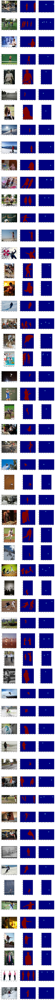

In [221]:
mtx = []

for i, info in enumerate(infos[743:800]):
    #print(i, info)
    img = load_image(info)
    head, body, mask = create_mask(info)
    
    seq_det = seq.to_deterministic()
    
    '''
    img = np.expand_dims(img, axis=0)
    mask = np.expand_dims(mask, axis=0)
    img = seq_det.augment_images(img)
    mask = seq_det.augment_images(mask)
    img = seq_image.augment_images(img)
    img = np.squeeze(img)
    mask = np.squeeze(mask)
    img = cv2.resize(img, (256, 256))
    mask = cv2.resize(mask, (256, 256))
    '''

    mtx.append([
        (lambda a: lambda x: plt.imshow(a))(img),
        (lambda a: lambda x: plt.imshow(a))(mask),
        (lambda a: lambda x: plt.imshow(a))(head)
    ])

mtx_plot(mtx, (6, 6))


In [177]:
cats_num = len([cat['name'] for cat in coco.loadCats(coco.getCatIds())]) # type: int

class CamVid(dataset_mixin.DatasetMixin):
    def __init__(self):
            self.infos = coco.loadImgs(coco.getImgIds(catIds=coco.getCatIds(catNms=['person']))) # type: List[dict]
    def __len__(self):
        return len(self.infos)
    def get_example(self, i):
        info = self.infos[i]
        img, mask = load_img(info)
        img = np.expand_dims(img, axis=0)
        mask = np.expand_dims(mask, axis=0)
        img = seq.augment_images(img)
        mask = seq.augment_images(mask)
        img = np.squeeze(img)
        mask = np.squeeze(mask)
        img = cv2.resize(img, (256, 256))
        mask = cv2.resize(mask, (256, 256))
        return (img, mask)

def load_img(imgInfo: dict) -> Tuple[np.ndarray, np.ndarray]:
    img = io.imread(imgInfo['coco_url'])
    anns = coco.loadAnns(coco.getAnnIds(imgIds=[imgInfo['id']],iscrowd=False)) # type: List[dict]
    mask_all = np.zeros((img.shape[0], img.shape[1]), np.uint8)
    for ann in anns:
        cat = coco.loadCats([ann["category_id"]])[0]
        if cat["name" ] != "person": continue
        rles = mask.frPyObjects(ann["segmentation"], img.shape[0], img.shape[1]) # type: List[dict]
        for i, rle in enumerate(rles):
            mask_img = mask.decode(rle) # type: np.ndarray
            mask_img[mask_img > 0] = 255
            mask_all += mask_img
    return (img, mask_all)



NameError: name 'coco' is not defined

In [ ]:
def convert_to_keras_batch(iter: Iterator[List[Tuple[np.ndarray, np.ndarray]]]) -> Iterator[Tuple[np.ndarray, np.ndarray]] :
    while True:
        batch = iter.__next__() # type: List[Tuple[np.ndarray, np.ndarray]]
        xs = [x for (x, _) in batch] # type: List[np.ndarray]
        ys = [y for (_, y) in batch] # type: List[np.ndarray]
        _xs = np.array(xs) # (n, 480, 360, 3)
        _ys = np.array(ys) # (n, 480, 360, n_classes)
        yield (_xs, _ys)


In [ ]:
train_iter = convert_to_keras_batch(
    SerialIterator(
    #MultiprocessIterator(
        CamVid(),
        batch_size=1,
        #n_processes=2,
        #n_prefetch=2,
        #shared_mem=1000*1000*5
    )
)
